# 0 Introduction

**This notebook was created by Yonatan Jenudi on December 2025.**

This notebook presents an end-to-end workflow for analyzing 3D breast MRI scans as part of the given home assignment. The goal is to build a practical pipeline that performs breast segmentation, tumor-candidate detection, and extraction of quantitative imaging features, followed by a simple exploratory analysis of their relationship to clinical variables.

The assignment includes 50 labeled training scans and 20 unlabeled test scans. The focus is not on achieving perfect accuracy but on demonstrating a clear, reproducible approach to preprocessing, segmentation, and feature interpretation in a medical-imaging context.

## 0.1 Imports

In [15]:
import nibabel as nib
import os
import seaborn as sns
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch

from src.utils import (validate_dataset_structure,
                         check_affine_consistency,
                         load_patient_scan,
                         plot_percentile_slices,
                         check_axial_orientation,
                         show_overlay,
                         orient_mask_up,
                         align_mask_left_right)
from src.clinical import (load_clinical_data,
                          plot_clinical_distributions)
from src.preprocessing import build_patient_df, MRIDataset, build_test_df
from src.training import train_unet
from src.eval import find_best_threshold, predict_and_plot_grid
from src.predict import run_pipeline_on_test

print(os.getcwd())

/content


## 0.2 args

In [ ]:
DATA_LOC = 'drive/MyDrive/data'   # Path to assignment data root folder

SEED = 42                               # Global random seed for reproducibility
PERCENT_FOR_VAL = 0.2                   # Fraction of patients used for validation
LEARNING_RATE = 1e-4                    # Optimizer learning rate for training the U-Net
BATCH_SIZE = 40                         # Number of slices per training batch
EPHOCS = 2                              # Number of training epochs (kept small for POC)
PATIENCE = 2                            # Early stopping patience based on validation loss

# 1 Data Loading and Basic Existence Checks

In [4]:
# Before starting any processing, we validate that the dataset is organized correctly.
# This helper ensures that all required folders (train scans, GT masks, inference data)
# and the clinical Excel file exist and are non-empty. It returns a structured object
# containing the resolved paths used throughout the pipeline.

paths = validate_dataset_structure(data_location=DATA_LOC,verbose=True)


  Dataset structure validated successfully:
  Base folder:          drive/MyDrive/work/home_assignments/assignment-breast_MRI
  Clinical features:    True
  Inference images:     20 files
  Train folder:         2 items
  ├─ GT masks:          50 files
  └─ Scans:             50 files



# 2 Data exploration

## 2.1 Structured (clinical)

In this section we load the structured clinical data provided in the assignment.
We inspect the table to understand the available labels (ER/PR/HER2, subtype, grade)
before integrating them later with the imaging-derived features.


In [5]:
clinical_df = load_clinical_data(paths.clinical_data)
clinical_df.head()

,er,pr,her2,mol_subtype,nottingham_grade
1,0,0,1,2,2
2,0,0,0,3,3
3,1,1,0,0,NaN
4,1,1,0,0,2
5,1,0,1,1,3


To understand the distribution of the clinical variables, we plot value histograms
for each categorical field (ER, PR, HER2, molecular subtype, and Nottingham grade).
This helps verify label balance and detect missing or uncommon categories before
performing feature correlations.


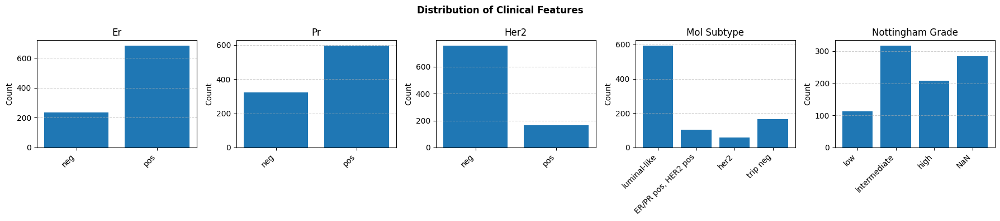

In [6]:
plot_clinical_distributions(clinical_df)

## 2.1 Unstructured (images)

We first validate that all scans have consistent orientation and voxel spacing.
This prevents mismatched or flipped volumes later during preprocessing and model inference.


In [7]:
check_affine_consistency(scans_folder=paths.scans_folder, max_workers=os.cpu_count())

Using workers: 12


Checking affines:   0%|          | 0/50 [00:00<?, ?it/s]

Reference scan: Breast_MRI_464.nii.gz
  Orientation: ('R', 'A', 'S')
  Voxel size : (np.float32(1.0), np.float32(1.0), np.float32(1.0))

 All scans have the same orientation and voxel spacing.


Even though all scans share the same affine matrix and voxel spacing, visual
inspection showed that the axial slices were not oriented consistently. This is
because the affine defines the coordinate system (R/A/S) but does not guarantee
how the image is displayed or the order of slices along each axis.

Some scans were effectively flipped along the superior–inferior axis, causing the
breasts to appear at the top instead of the bottom of the image. Therefore, an
additional orientation-normalization step was applied to make all scans visually
consistent before training the U-Net.


### Axial Orientation Normalization

When visualizing the axial plane across random patients, I noticed that the breast orientation was inconsistent:

- In some scans (e.g., Patient 489), the breasts appear at the bottom of the image (correct orientation).
- In others (e.g., Patient 575), the breasts appear at the top of the image (the scan is flipped vertically).

This inconsistency interferes with both visualization and model training, since the network would otherwise receive differently oriented volumes representing the same anatomy.

---

#### Goal

Standardize orientation across all patients:

- Breasts should always appear at the bottom of the axial image.
- The head-to-feet direction (Z-axis) should be consistent across volumes.

---

#### Axial (Vertical) Orientation Correction

To automatically detect and fix vertically flipped scans in the axial plane, the following heuristic is applied:

1. Select the axial slice at the 90th percentile of the Z-axis.  
   This slice typically contains visible breast tissue while avoiding very upper slices that may be noisier.

2. Split the selected slice into two halves along the vertical axis (axis 0):

   - Upper half: `slice[:mid, :]`
   - Lower half: `slice[mid:, :]`

3. Compute the mean intensity of each half:

   ```python
   upper_mean = upper_half.mean()
   lower_mean = lower_half.mean()
    ```
4. Decision rule:
    - If **lower_mean** > **upper_mean** , breast tissue is predominantly in the lower half, so the orientation is correct (no action).
    - Otherwise, brighter tissue is concentrated in the upper half, indicating the scan is vertically flipped, so flip along axis 0:

   ```python
   data = data[::-1, :, :]
    ```

---

#### Z-axis (Head-Foot) Orientation Correction

In addition to vertical flipping within axial slices, some scans show inconsistent ordering along the Z-axis (head-to-feet direction). To correct this, a second heuristic is applied:

1. Compare mean intensities at two Z locations:

- A slice near the 10th percentile of the Z-axis (upper chest / head direction).

- A slice near the 90th percentile of the Z-axis (lower chest / abdominal direction).

2. Anatomical assumption:

- Upper chest regions tend to contain more bone structures (clavicles, ribs, spine), which often appear brighter in MRI.

- Lower regions tend to contain more visceral organs and soft tissue, which often appear darker on average.

3. Decision rule:

- If the 90th percentile slice has higher mean intensity than the 10th percentile slice, the Z-axis ordering is likely reversed.

- In this case, reverse the Z-axis (axis 2):

   ```python
   data = data[::-1, :, ::-1]
    ```
This enforces a consistent head-to-feet anatomical direction across all volumes.

---

#### **Result**
After applying both orientation checks:

- All axial slices follow the same vertical convention.

- The Z-axis direction is standardized across patients.

- V isualization becomes consistent.

- Downstream preprocessing and model training receive standardized input volumes.

This normalization step is integrated into the data-loading pipeline and runs automatically whenever a patient scan is loaded.

Slice Visualization Explanation

The figure displays 15 representative MRI slices from Breast_MRI_575.nii.gz, arranged in a 3×5 grid:

* Rows = anatomical planes

* Sagittal – slices along the x-axis (side-to-side view)

* Coronal – slices along the y-axis (front/back view)

* Axial – slices along the z-axis (top/bottom view)

* Columns = slice percentiles
Each plane is sampled at 10%, 25%, 50%, 75%, and 90% of its axis, giving a compact summary of the entire 3D scan.

This visualization allows quick inspection of orientation, anatomical structure, and overall scan consistency.

Showing: Breast_MRI_575.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_575.nii.gz


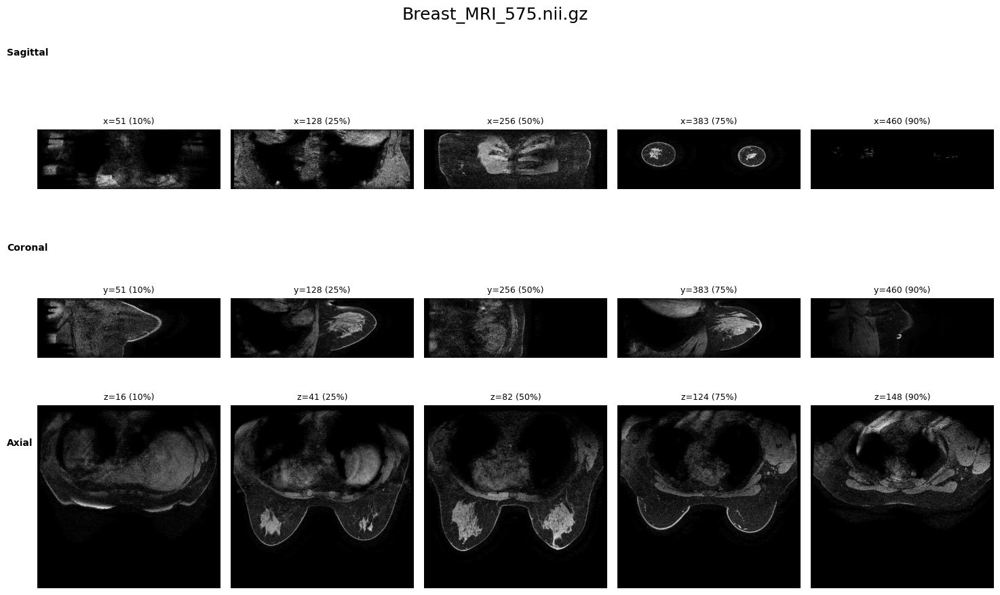

Showing: Breast_MRI_489.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_489.nii.gz


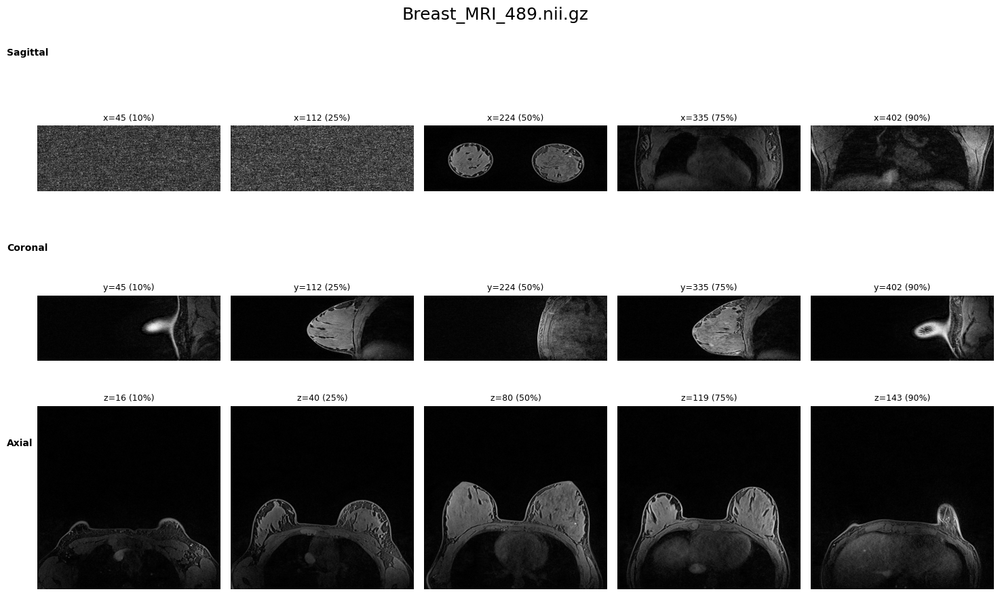

In [8]:
# Demonstration:
# 1) Patient 575 — shows the orientation problem.
# 2) Patient 489 — already correct, used to show that the fix does not alter correct scans.

scan_name, data = load_patient_scan(paths.scans_folder,
                                    patient_id=575,
                                    check_orientation=False)
plot_percentile_slices(data, scan_name)

scan_name, data = load_patient_scan(paths.scans_folder,
                                    patient_id=489,
                                    check_orientation=False)
plot_percentile_slices(data, scan_name)

Showing: Breast_MRI_575.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_575.nii.gz
[Orientation] upper is brighter → flipping axis 0
[Orientation] Z-axis appears reversed → flipping axis 2


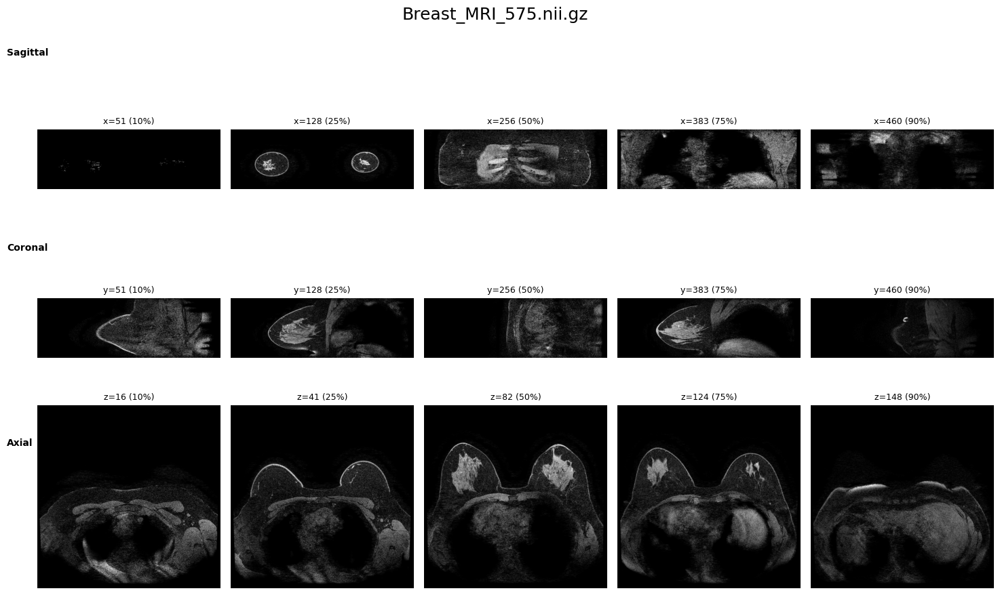

Showing: Breast_MRI_489.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_489.nii.gz
[Orientation] vertical orientation looks OK
[Orientation] Z-axis orientation looks OK


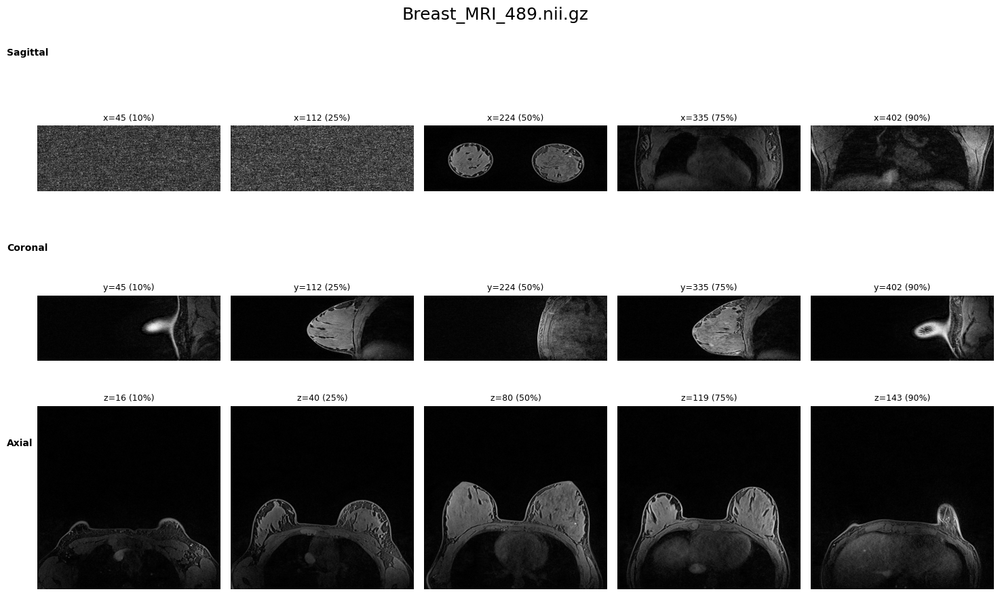

In [9]:
# Apply orientation correction:
# - Patient 575 should be corrected.
# - Patient 489 is already correct and should remain unchanged.

scan_name, data = load_patient_scan(paths.scans_folder,
                                    patient_id=575,
                                    check_orientation=True,
                                    verbose=True)
plot_percentile_slices(data, scan_name)

scan_name, data = load_patient_scan(paths.scans_folder,
                                    patient_id=489,
                                    check_orientation=True,
                                    verbose=True)
plot_percentile_slices(data, scan_name)

Showing: Breast_MRI_827.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_827.nii.gz


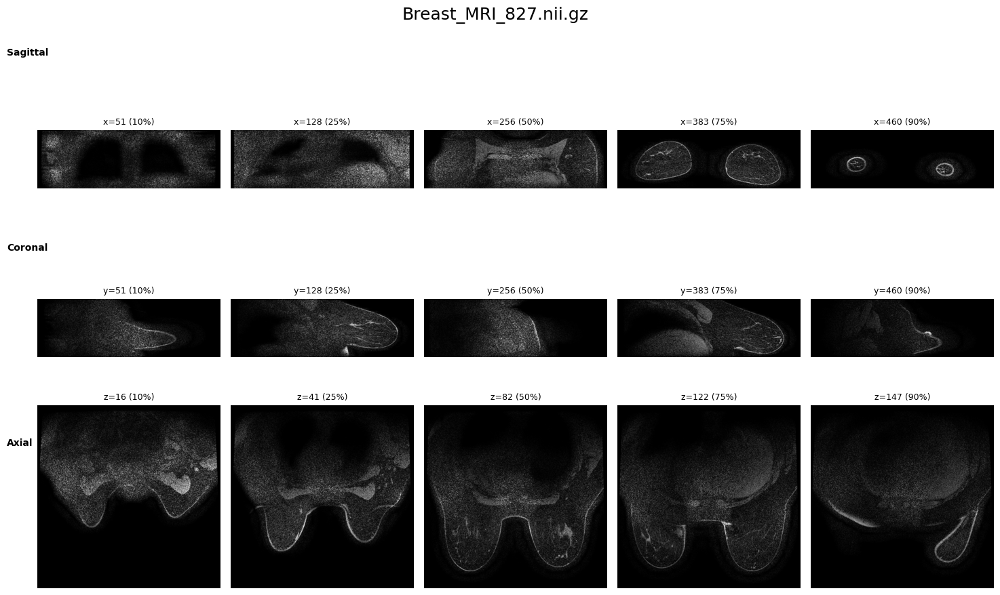

Showing: Breast_MRI_827.nii.gz
drive/MyDrive/work/home_assignments/assignment-breast_MRI/train_data/scans/Breast_MRI_827.nii.gz
[Orientation] upper is brighter → flipping axis 0
[Orientation] Z-axis orientation looks OK


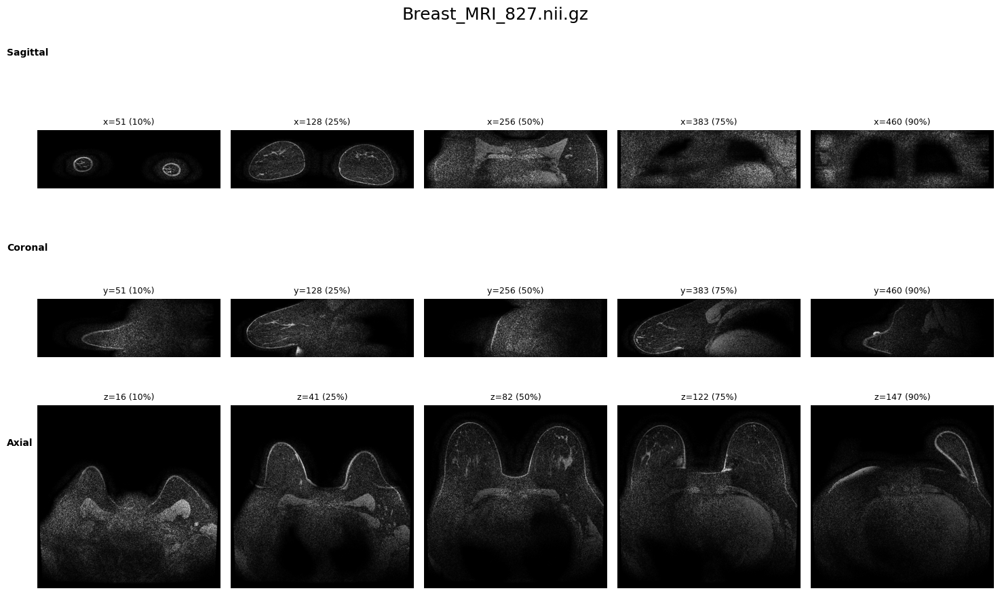

In [10]:
# Example of another problematic scan (827) — before and after correction.

scan_name, data = load_patient_scan(paths.scans_folder, patient_id=827, check_orientation=False)
plot_percentile_slices(data, scan_name)

scan_name, data = load_patient_scan(paths.scans_folder, patient_id=827, check_orientation=True,verbose=True)
plot_percentile_slices(data, scan_name)

### Mask Orientation Problems and Corrections

While the breast MRI scans were normalized to a consistent orientation (“breasts down” in the axial view), the **ground-truth segmentation masks were not always aligned with the scans**. Two common issues were observed:

- Some masks were **vertically flipped** relative to the scan.

- Some masks were **mirrored left–right**, causing poor overlap with breast tissue.

To resolve this, two lightweight heuristic corrections were applied.

---

#### 1. Axial “up” normalization (mask-only, flip along axis 0)

This step uses **only the mask** to ensure that the breast in the mask points in
the same axial direction for all patients.

Algorithm (`orient_mask_up`):

1. Binarize the mask (`mask > 0`).
2. Find the **axial slice** (z) with the **largest total mask area**.
3. In that slice:
- Compute the number of masked pixels in each horizontal row.
- Identify the dominant row (row with maximum mask pixels).
4. Compute:
- Total mask mass **above** the dominant row.
- Total mask mass **below** the dominant row.
5. If most of the mask mass lies below the dominant row, the mask is considered to be “looking down” and is flipped along axis 0.
6. Otherwise, the mask orientation is kept unchanged.

This makes the mask consistent with the convention “breasts down” without needing
the original image.

---

#### 2. Left–right alignment with the scan (uses mask + image, flip along axis 1)

After fixing the axial direction, some masks were still **mirrored left–right**
relative to the scan. Here we use both the **scan intensities** and the **mask**
to decide whether to flip along **axis 1**.

Algorithm (`align_mask_left_right`):

1. Binarize the mask and again pick the **axial slice with maximum mask area**.
2. On that slice, compute an intensity threshold (e.g. the **40th percentile**) on
   the scan; pixels below this are treated as **background “dead zone”**.
3. For this slice, compute:
   - `overlap_orig`: number of mask pixels that fall inside the dead zone.
   - `overlap_flip`: same quantity, but for the mask **flipped along axis 1**.
4. If `overlap_flip < overlap_orig`, the flipped version puts **less mask in
   background**, so we **flip the full 3D mask along axis 1** (`mask[:, ::-1, :]`).
5. Otherwise we keep the original orientation.

---

#### Result

Together, these two steps make the masks **point up** and **match the
left–right orientation** of the scan, so that the overlay of scan + mask is
geometrically consistent across all patients. This ensures the mask aligns with breast tissue and avoids placing segmentation in background regions.

Example: Mask orientation fixes for patients 489,575,587

For these patients I visualize three versions of the mask over the same
orientation-corrected scan:

1. **Raw mask** – as loaded from disk (shows the original misalignment).
2. **After axial “up” correction** (`orient_mask_up`) – fixes upside-down masks.
3. **After left–right alignment** (`align_mask_left_right`) – flips along the
   left–right axis if needed so the mask matches the breast location in the scan.


[Orientation] vertical orientation looks OK
[Orientation] Z-axis orientation looks OK

Patient 489 – raw mask (no correction)
Using slice 77


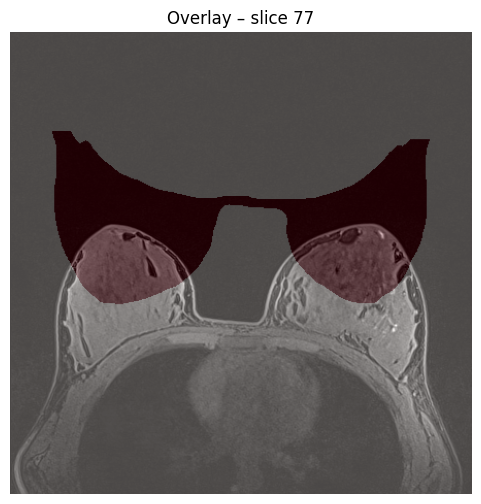

[Mask orient] mask looks 'down' → flipping along axis 0

Patient 489 – after axial 'up' correction (orient_mask_up)
Using slice 77


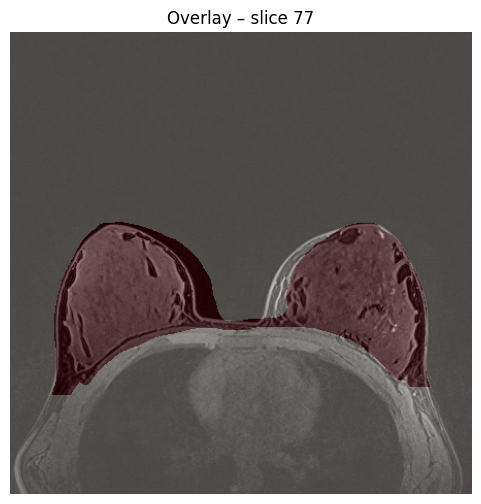

[Mask Y-orient] using slice z=77 for scoring
[Mask Y-orient] original dead-overlap = 1040
[Mask Y-orient] flipped-y dead-overlap = 508
[Mask Y-orient] flipping along axis 1

Patient 489 – after left–right alignment (align_mask_left_right)
Using slice 77


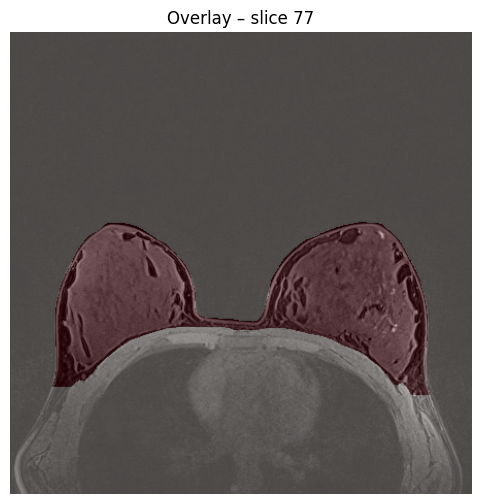

[Orientation] upper is brighter → flipping axis 0
[Orientation] Z-axis appears reversed → flipping axis 2

Patient 575 – raw mask (no correction)
Using slice 94


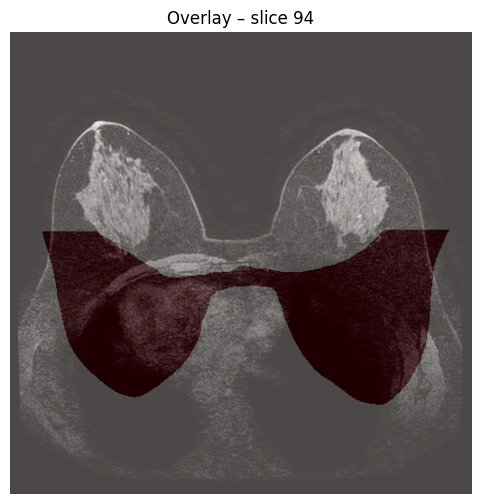

[Mask orient] mask looks 'down' → flipping along axis 0

Patient 575 – after axial 'up' correction (orient_mask_up)
Using slice 94


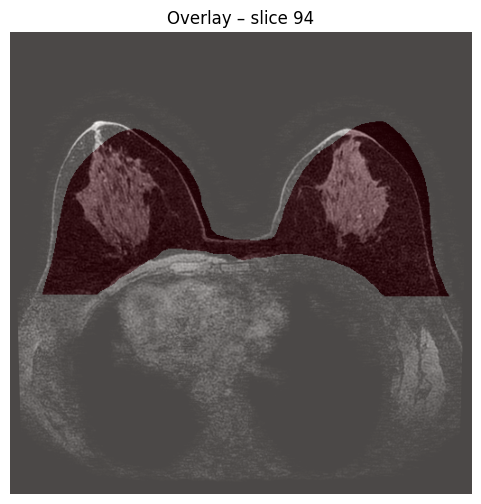

[Mask Y-orient] using slice z=94 for scoring
[Mask Y-orient] original dead-overlap = 190
[Mask Y-orient] flipped-y dead-overlap = 36
[Mask Y-orient] flipping along axis 1

Patient 575 – after left–right alignment (align_mask_left_right)
Using slice 94


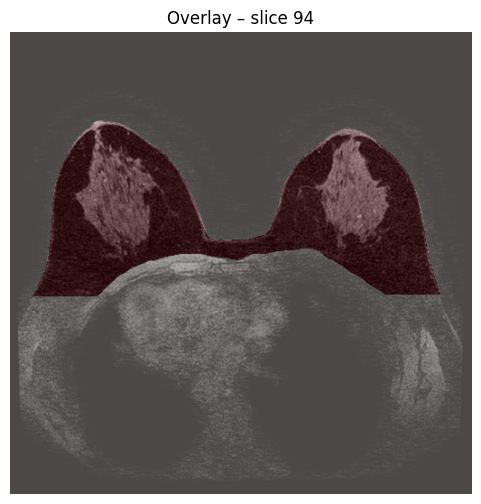

[Orientation] vertical orientation looks OK
[Orientation] Z-axis orientation looks OK

Patient 587 – raw mask (no correction)
Using slice 112


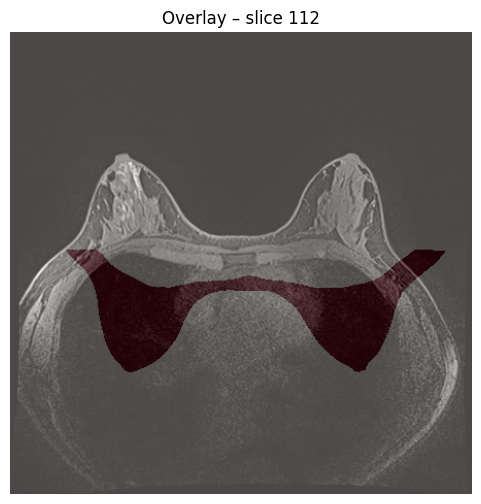

[Mask orient] mask looks 'down' → flipping along axis 0

Patient 587 – after axial 'up' correction (orient_mask_up)
Using slice 112


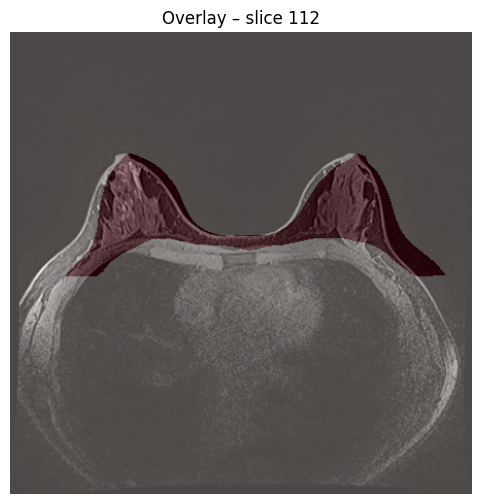

[Mask Y-orient] using slice z=112 for scoring
[Mask Y-orient] original dead-overlap = 422
[Mask Y-orient] flipped-y dead-overlap = 95
[Mask Y-orient] flipping along axis 1

Patient 587 – after left–right alignment (align_mask_left_right)
Using slice 112


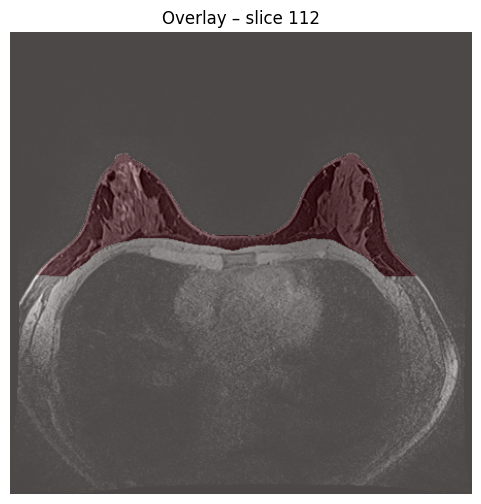

In [11]:
# Examples – visualize mask orientation corrections step by step

for i in [489,575,587]:
    pt = i

    # 1) Load scan and mask volumes for this patient
    scan_path = paths.scans_folder / f"Breast_MRI_{pt}.nii.gz"
    mask_path = paths.gt_folder     / f"Breast_MRI_{pt}.nii.gz"

    scan_img = nib.load(str(scan_path))
    mask_img = nib.load(str(mask_path))

    scan = scan_img.get_fdata()
    mask_raw = mask_img.get_fdata()

    # For a fair comparison we first fix the scan orientation (breasts down).
    # NOTE: we do *not* touch the mask yet – this is what we want to debug.
    scan = check_axial_orientation(scan,verbose=True)

    # 2) Show raw mask (no correction)
    print(f"\nPatient {pt} – raw mask (no correction)")
    show_overlay(scan, mask_raw)

    # 3) Apply first correction: orient_mask_up (axial flip only, mask-only)
    mask_step1 = orient_mask_up(mask_raw,verbose=True)

    print(f"\nPatient {pt} – after axial 'up' correction (orient_mask_up)")
    show_overlay(scan, mask_step1)

    # 4) Apply second correction: align_mask_left_right
    #    (uses scan + mask to decide whether to flip along axis 1)
    mask_step2 = align_mask_left_right(scan, mask_step1,verbose=True)

    print(f"\nPatient {pt} – after left–right alignment (align_mask_left_right)")
    show_overlay(scan, mask_step2)

# 3 Building the Slice-Level Dataset (Train + Validation)

This section constructs the full dataset used for training the segmentation model.  
The goal is to take each patient’s **3D scan and 3D mask**, correct their orientation, and explode them into **2D slice pairs** suitable for a U-Net.

The pipeline has two major components:

1. **`_process_one` — Per-Patient Preprocessing Worker**  
2. **`build_patient_df` — Parallel Execution + Dataset Assembly**

---

### `_process_one` — Per-Patient Preprocessing Worker

This function runs in parallel, one patient per CPU, and performs:

1. **Extract patient ID**  
   - The numeric ID is parsed from the filename.  
     Example: `Breast_MRI_587.nii.gz → 587`.

2. **Locate the matching mask**  
   - The mask file must have the same filename as the scan and live in the masks folder.  
   - If the mask is missing, an error is raised.

3. **Load the NIfTI volumes**  
   - Both scan and mask are loaded as **H × W × Z** NumPy arrays.

4. **Apply all orientation corrections**

   To ensure geometric consistency between the scan and mask, we apply:

   - `check_axial_orientation(scan)`  
     - Fixes flipped scans so the breasts always appear at the **bottom** of the image.

   - `orient_mask_up(mask)`  
     - Ensures the mask is not upside-down (based only on mask geometry).

   - `align_mask_left_right(scan, mask)`  
     - Fixes left–right mismatches by comparing mask pixels to the scan’s background intensity.

   After this step, the `(scan, mask)` pair is fully aligned.

5. **Return a patient dictionary**

   Each worker returns:

   ```python
   {
       "patient_id": ...,
       "img": scan_volume,   # 3D array
       "mask": mask_volume,  # 3D array
   }
    ```

### `build_patient_df` — Parallel Execution + Dataset Assembly

This function orchestrates the full preprocessing pipeline.

1. Gather all scan files
   - Recursively collect all scan paths.
   - Supports both `.nii` and `.nii.gz` formats.

2. Select number of workers
   - By default, use all CPUs except one to keep the machine responsive.

3. Run preprocessing in parallel
   - Use `multiprocessing.Pool.imap` to apply `_process_one` to every scan.
   - Wrap the iterator with `tqdm` to display a progress bar.

4. Build a patient-level DataFrame
   - Each row corresponds to a single patient.
   - Columns include:
     - `patient_id`
     - `img` (3D scan volume)
     - `mask` (3D mask volume)

5. Perform patient-level train/validation split
   - Split on patient ID, not slices, to prevent leakage between train and validation sets.
   - Store the split as a `validation` column:
     - `0` → train
     - `1` → validation

6. Convert 3D volumes into a slice-level dataset
   - Explode the 3D scan into axial slices.
   - Explode the 3D mask accordingly.
   - Add a `slice_number` column to track axial index.

    Example:

    ```python
    df_explode = df.explode(["img", "mask", "slice_number"])
    ```

In [12]:
df = build_patient_df(scans_folder=paths.scans_folder,
                      masks_folder=paths.gt_folder,
                      val_frac=PERCENT_FOR_VAL,
                      seed=SEED)

df.head()

Using 11 CPU workers...


  0%|          | 0/50 [00:00<?, ?it/s]

,img,mask,validation,slice_number
patient_id,,,,
497,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1,0
497,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1,1
497,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1,2
497,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1,3
497,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1,4


# 4 Preprocessing Pipeline: Resizing, Padding, and Dataset Construction

This section describes two key components of the preprocessing workflow used before training the U-Net segmentation model:

resize_and_pad() — converts each MRI slice into a square image (e.g., 512×512) while preserving anatomical proportions.

MRIDataset — a PyTorch dataset class that loads slices, preprocesses them, and prepares them for training.

## `resize_and_pad` — Aspect-Ratio Preserving Resize + Padding

This function takes a tensor of shape `(1, H, W)` and produces a square tensor `(1, target_size, target_size)` using two steps:

1. **Resize while preserving aspect ratio**
   - Compute a scale factor so that the **longest side** becomes `target_size`.
   - Resize the tensor using `F.interpolate`.
   - `mode="bilinear"` is used for images; `mode="nearest"` is used for masks to avoid label interpolation.

2. **Pad to the final square size**
   - Compute how much padding is needed in height and width.
   - Pad symmetrically on all sides (top, bottom, left, right).
   - The output is always `(1, target_size, target_size)`.

This is useful for U-Net models that require fixed input size.

---

## `MRIDataset` — Slice-Level Dataset for 2D Segmentation

This dataset receives a DataFrame where each row represents **one axial slice**.  
The class prepares each slice for training by applying clipping, resizing, normalization, and tensor conversion.

### 1. **Initialization**

The constructor extracts:

- `img`: list of 2D numpy arrays (H, W)
- `mask`: list of 2D numpy arrays (H, W)
- `slice_number`: axial index of the slice
- `patient_id`: implicit from DataFrame index
- `target_size`: final size for U-Net (e.g., 512)
- `clip_percentiles`: used for per-image contrast clipping (default: 1st–99th percentile)

These values are stored for use in `__getitem__`.

---

### 2. **`__len__`**

Returns the number of slices in the dataset.

---

### 3. **`__getitem__` — Full preprocessing of a single slice**

Given an index, this method performs:

1. **Load numpy image and mask**
   - Converts to `float32`.

2. **Percentile clipping**
   - Compute the low and high percentiles (`clip_low`, `clip_high`).
   - Clip values to reduce extreme noise before normalization.

3. **Convert to torch tensors**
   - Add channel dimension → shape becomes `(1, H, W)`.

4. **Resize + pad to square shape**
   - Apply `resize_and_pad(x, mode="bilinear")` for the image.
   - Apply `resize_and_pad(y, mode="nearest")` for the mask.

5. **Intensity normalization**
   - Standard score normalization:  
     `(x - mean) / std`
   - If `std < 1e-6`, fallback to `1.0`.

6. **Mask formatting**
   - Ensure the mask is floating point with shape `(1, target_size, target_size)`.

7. **Return tuple**
   - `x`: normalized image  
   - `y`: mask  
   - `patient_id`: from DataFrame index  
   - `slice_number`: axial index

This dataset structure ensures clean, consistent input to a 2D U-Net architecture.



# 5 U-Net Architecture Used for Breast MRI Segmentation

The model used for training is a 2D U-Net, a convolutional neural network architecture widely used for medical image segmentation.  
U-Net takes an input image (e.g., a 512×512 MRI slice) and produces a pixel-wise segmentation mask of the same spatial resolution.

To improve generalization and reduce overfitting, **spatial dropout (`Dropout2d`) is incorporated throughout the network**, with **stronger regularization at the bottleneck**.

---

### `DoubleConv`

Core feature-extraction block consisting of two convolutional layers:

- Conv → BatchNorm → ReLU → **Dropout2d**
- Conv → BatchNorm → ReLU → **Dropout2d**

Key properties:
- Spatial size is preserved (`kernel_size=3`, `padding=1`).
- `Dropout2d` randomly zeroes entire feature maps, which is more suitable for convolutional features than standard dropout.
- A configurable dropout probability (`dropout_p`) allows tuning the regularization strength.

This block is used throughout both the encoder and decoder paths.

---

### `Down`

Downsampling block used in the encoder path:

- `MaxPool2d(2)` reduces spatial resolution by a factor of 2.
- Followed by a `DoubleConv` block with dropout.

Purpose:
- Increase receptive field.
- Learn higher-level, more abstract features.
- Apply regularization via dropout at lower resolutions.

---

### `Up`

Upsampling block with skip connections, used in the decoder path:

- Upsample the feature map (bilinear upsampling or transposed convolution).
- Pad if needed to match the spatial dimensions of the skip connection.
- Concatenate the corresponding encoder feature map.
- Apply `DoubleConv` with dropout to fuse features.

Dropout in the decoder helps prevent co-adaptation between encoder and decoder features.

---

### `OutConv`

Final `1×1` convolution that maps the decoder output to `n_classes` channels.

- For binary segmentation, the output has a single channel.
- No dropout is applied at this stage to preserve prediction stability.

---

## U-Net Forward Pass (High-Level)

1. **Encoder**
   - `x1 = inc(x)`  
   - `x2 = down1(x1)`  
   - `x3 = down2(x2)`  
   - `x4 = down3(x3)`  
   - `x5 = down4(x4)`  

2. **Decoder with skip connections**
   - `x = up1(x5, x4)`  
   - `x = up2(x,  x3)`  
   - `x = up3(x,  x2)`  
   - `x = up4(x,  x1)`  

3. **Output**
   - `logits = outc(x)` → segmentation map of shape `(B, 1, H, W)`

---

## Dropout Strategy

- **Encoder & Decoder:**  
  A moderate dropout probability (e.g., `dropout_p = 0.1`) is applied inside `DoubleConv` blocks to improve generalization while preserving spatial structure.

- **Bottleneck:**  
  A higher dropout probability (e.g., `dropout_p = 0.3`) is used at the deepest layer of the network, where features are most abstract and the risk of overfitting is highest.

This strategy follows common U-Net regularization practices for medical imaging tasks.

---

## Summary of the Architecture

| Stage       | Resolution | Features | Operation                      |
|-------------|------------|----------|--------------------------------|
| Encoder 1   | 512×512    | 64       | DoubleConv + Dropout2d         |
| Encoder 2   | 256×256    | 128      | Down + Dropout2d               |
| Encoder 3   | 128×128    | 256      | Down + Dropout2d               |
| Encoder 4   | 64×64      | 512      | Down + Dropout2d               |
| Bottleneck  | 32×32      | 512      | DoubleConv + **higher dropout**|
| Decoder 1   | 64×64      | 256      | Up + skip + Dropout2d          |
| Decoder 2   | 128×128    | 128      | Up + skip + Dropout2d          |
| Decoder 3   | 256×256    | 64       | Up + skip + Dropout2d          |
| Decoder 4   | 512×512    | 64       | Up + skip + Dropout2d          |
| Output      | 512×512    | 1        | 1×1 Conv                       |


Dice Loss Function

The Dice loss measures overlap between the predicted segmentation and the ground-truth mask.
It is especially useful for medical images where foreground pixels (tumor/breast tissue) are sparse.

# 6 Training Loop

The training function follows a standard deep-learning workflow with mini-batch training, validation, and early stopping to prevent overfitting.

1. Dataset & DataLoader Setup

    * Convert the preprocessed patient dataframe into PyTorch datasets (MRIDataset).

    * Create train_loader and val_loader to iterate over batches efficiently.

    * Shuffle is enabled only for the training set.

2. Model & Optimization

    * Initialize a U-Net with 1 input channel and 1 output channel.

    * Move model to GPU if available.

    * Use the Adam optimizer and the Dice loss function (suited for segmentation).

3. Training Loop (per epoch)

    * Each epoch has two phases:

    ✔ Training Phase

    * Set model to train() mode.

    * For each mini-batch:

    * Move inputs & masks to device.

    * Forward pass → compute logits.

    * Compute Dice loss.

    * Backpropagate and update weights.

    * Track average training loss.

    ✔ Validation Phase

    * Set model to eval() mode.

    * Disable gradient calculation (torch.no_grad()).

    * Compute loss on the validation set.

    * Track average validation loss.

4. Early Stopping

    * If validation loss improves → save the model state.

    * If not → increase patience counter.

    * Stop training when no improvement is seen for patience consecutive epochs.

5. Loss Curves

    * At the end, training and validation losses are plotted to visualize convergence.

6. Output

    * The function returns the best performing model (based on validation loss).

Using device: cuda
Starting U-Net training...


Training Epoch 1:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 1:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 2:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 2:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 3:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 3:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 4:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 4:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 5:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 5:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 6:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 6:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 7:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 7:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 8:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 8:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 9:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 9:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 10:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 10:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 11:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 11:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 12:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 12:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 13:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 13:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 14:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 14:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 15:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 15:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 16:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 16:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 17:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 17:   0%|          | 0/38 [00:00<?, ?it/s]

Training Epoch 18:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 18:   0%|          | 0/38 [00:00<?, ?it/s]

EarlyStopping counter: 1/2


Training Epoch 19:   0%|          | 0/150 [00:00<?, ?it/s]

Validating Epoch 19:   0%|          | 0/38 [00:00<?, ?it/s]

EarlyStopping counter: 2/2
Early stopping triggered!


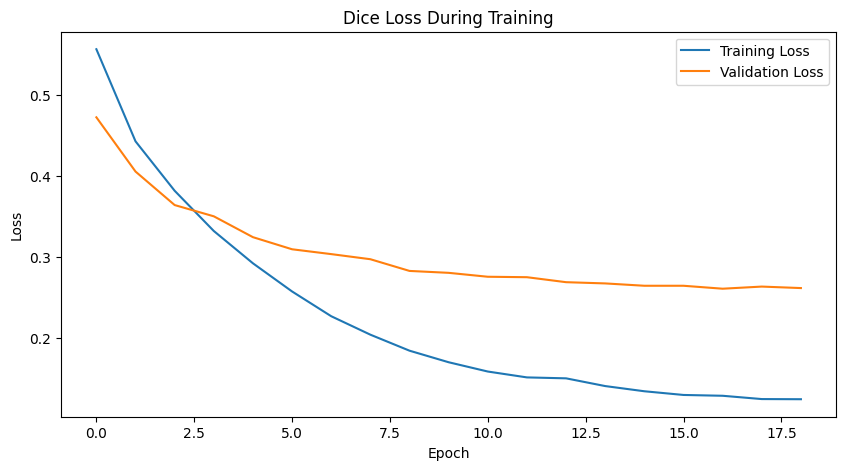

In [13]:
model = train_unet(
    train_df=df[df['validation']==0],
    val_df=df[df['validation']==1],
    batch_size=45,
    epochs=20,
    patience=PATIENCE,
    learning_rate=LEARNING_RATE)

# 7 Evaluation

## 7.1 Threshold Optimization for Binary Segmentation

U-Net outputs **probability maps**, not binary masks.  
To convert probabilities into a final segmentation, we must choose a **threshold**:

\[
$\hat{y}(p)$ = \begin{cases}
1 & \text{if } p > \tau \\
0 & \text{otherwise}
\end{cases}
\]

Although many works choose a fixed value such as **τ = 0.5**, the optimal threshold actually depends on:

- the dataset’s intensity distribution  
- the model’s calibration  
- the class imbalance  
- the Dice loss used during training  

Choosing the wrong threshold can significantly reduce Dice performance.

---

## What the threshold-search function does

To find the optimal threshold, we systematically scan many candidate values between **0.05 and 0.95** and evaluate the Dice score for each:

1. Loop over 20 different threshold values  
2. Run the model over the entire validation set  
3. Convert probabilities → binary mask using the current threshold  
4. Compute the Dice score (1 − dice_loss)  
5. Store the mean Dice score for that threshold  
6. Select the threshold that gives the **highest validation Dice**

---

## Dice vs. Threshold Curve

After computing validation Dice for each threshold, we generate a plot:

- **X-axis:** threshold value  
- **Y-axis:** Dice score  

This visualization shows how sensitive the model is to the probability cutoff and reveals the threshold that yields the best segmentation quality.

Example result:



Scanning thresholds:   0%|          | 0/20 [00:00<?, ?it/s]

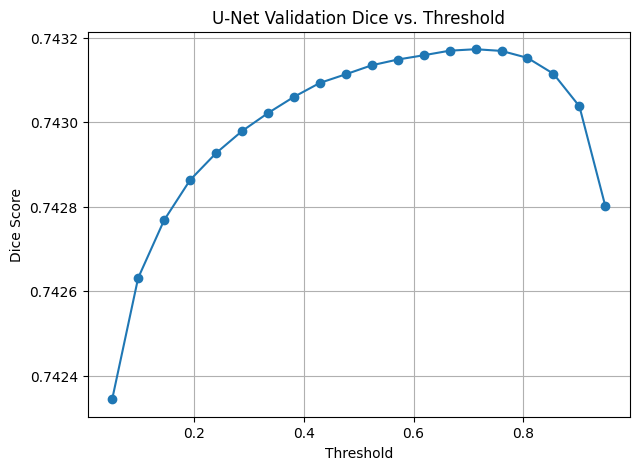

Best threshold: 0.713 | Dice: 0.7432
Best threshold: 0.7131578947368421


In [16]:
val_dataset   = MRIDataset(df[df['validation']==1],   is_train=False)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False)
best_th, ths, scores = find_best_threshold(model, val_loader)
print("Best threshold:", best_th)

## 7.2 Inference data preperation

### build_test_df — Convert 3D Test Scans into Slice-Level Rows
This function loads each 3D MRI test scan, fixes its axial orientation, and splits it into **individual 2D slices**.  
Each slice becomes a separate row in a DataFrame with:

- `patient_id` — extracted from filename  
- `slice_index` — the z-index of the slice  
- `img` — the raw 2D slice (H×W)  
- `orig_h`, `orig_w` — original scan dimensions  

This prepares the test set for **2D U-Net inference**, which operates on single slices.

---

### MRITestDataset — Preprocessing Test Slices for U-Net
This dataset class takes the DataFrame created above and performs:

1. **Percentile clipping** (1–99%) to reduce intensity outliers  
2. **Channel expansion** to shape (1, H, W)  
3. **Resize + pad** to the U-Net input size (512×512)  
4. **Z-score normalization**  
5. Returns both:
   - the processed tensor  
   - the original slice (for plotting and reconstruction)

This allows clean, consistent preprocessing of each test slice before running inference.


## 7.3 Restore Mask to Original Image Size

During inference, each slice is resized and padded to a square (512×512) before
being passed to the U-Net. This helper function **reverses** that transformation
for a predicted mask:

1. Recomputes the same **scale and padding** that were used in `resize_and_pad`
   based on the original height/width (`orig_h`, `orig_w`).
2. **Crops out the padding** from the 512×512 mask.
3. **Resizes** the cropped mask back to `(orig_h, orig_w)` using `nearest`
   interpolation (to preserve the binary mask).
4. Returns a NumPy array aligned with the **original image resolution**.

This allows us to overlay the predicted mask directly on the original MRI slice.

---

### predict_and_plot_grid — Visualizing Predictions in a Patient×Slice Grid

This function creates a **grid of qualitative results** to inspect model
performance:

- **Rows**: randomly selected patients  
- **Columns**: consecutive slices around the middle of each patient’s volume  

For each displayed slice:

1. The corresponding test sample is taken from `MRITestDataset`.
2. The slice is preprocessed and fed through the U-Net to obtain a probability
   map.
3. The probability map is thresholded to a binary mask.
4. `undo_resize_and_pad` is used to map the mask back to the original
   image size.
5. The original slice is shown in grayscale with the predicted mask overlaid
   in red.

This visualization helps verify that the model detects plausible breast/tumor
regions across multiple adjacent slices and patients.


Building test_df:   0%|          | 0/20 [00:00<?, ?it/s]

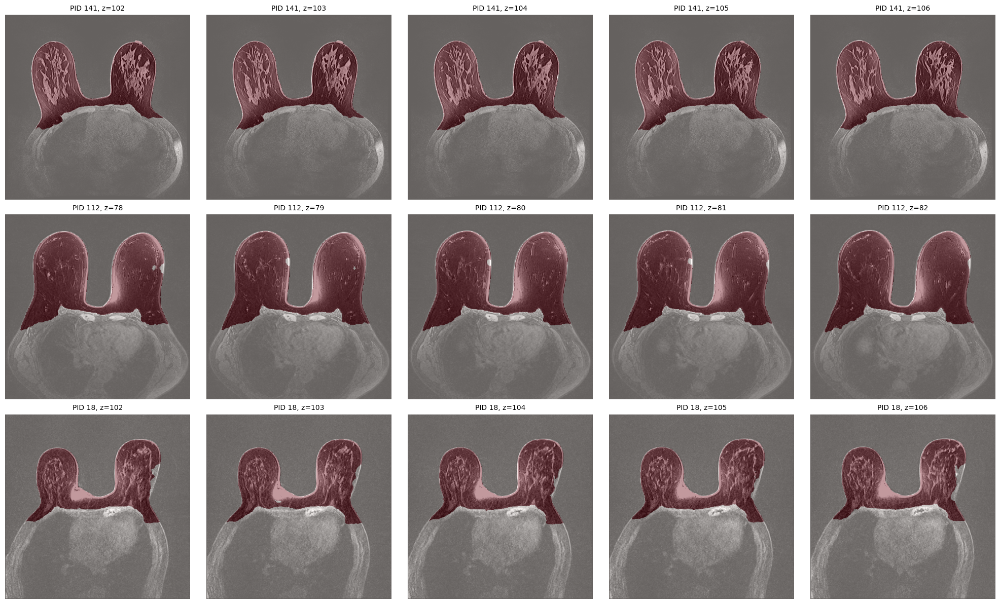

In [17]:
test_df = build_test_df(paths.inference_data)
predict_and_plot_grid(model=model,test_df=test_df,threshold=best_th)

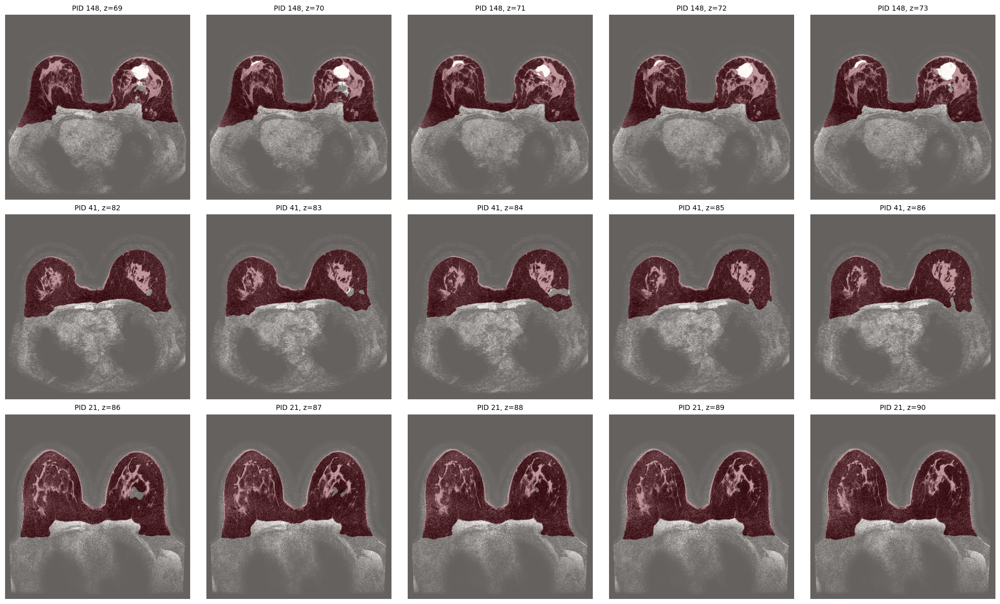

In [18]:
predict_and_plot_grid(model=model,test_df=test_df,threshold=best_th)

# 8 Full Inference Pipeline: Breast Mask → Tumor Candidate → Features

This section runs the complete 3D pipeline on the **test scans**:
1. Predict a **3D breast mask** using the trained 2D U-Net.
2. Detect a **tumor candidate** inside the breast.
3. Extract simple quantitative features per patient.

---

#### `predict_breast_mask_3d(...)` — Slice-wise U-Net Inference to 3D Mask

This function applies the trained 2D U-Net to an entire 3D volume:

- Input: a single 3D MRI `scan_data` of shape `(H, W, Z)`.
- For each axial slice `z`:
  1. Apply the same **percentile clipping** as in training (1–99%).
  2. Convert to tensor, **resize + pad** to `(1, 512, 512)` using `resize_and_pad`.
  3. **Z-score normalize** (mean/std per slice).
  4. Run the U-Net to get a probability map.
  5. Threshold with a chosen value (e.g. 0.95) to get a binary mask at 512×512.
  6. Use `undo_resize_and_pad` to map the mask back to the original `(H, W)` size.
- The per-slice masks are stacked to form a full **3D breast mask** `(H, W, Z)`.

Output: `mask_3d` – boolean array indicating predicted breast tissue in 3D.

---

#### `detect_tumor_candidate(...)` — Largest High-Intensity Component Inside Breast

This function finds a **tumor candidate region** inside the predicted breast mask:

- Restricts analysis to voxels where `breast_mask == True`.
- Computes a high-intensity threshold (e.g. 98th percentile of intensities within the breast).
- Marks all voxels ≥ this threshold (inside the breast) as **high-intensity candidates**.
- Runs 3D connected-component labeling on these candidates.
- Keeps **only the largest connected component** as the **tumor candidate**.
- Computes simple features:
  - `volume_voxels` – number of voxels in the candidate
  - `mean_intensity` – mean signal inside the candidate
  - `max_intensity` – maximum signal inside the candidate

Output:
- `tumor_mask` — 3D boolean mask of the tumor candidate  
- `features` — dictionary with the quantitative measures

---

#### `run_pipeline_on_test(...)` — Apply Pipeline to All Test Scans

This function runs the full pipeline for every test scan in a folder:

1. Iterate over all `.nii` / `.nii.gz` files in `test_scans_folder`.
2. Extract `patient_id` from the filename.
3. Load the 3D scan and apply `check_axial_orientation` (same convention as training).
4. Call `predict_breast_mask_3d(...)` to obtain a 3D breast mask.
5. Optionally clean the breast mask by keeping only its **largest connected component**.
6. Call `detect_tumor_candidate(...)` to get:
   - `tumor_mask`
   - per-patient feature dictionary (`feats`)
7. Add `patient_id` to `feats` and append it to a list.

Finally, all feature dicts are combined into a **DataFrame**:

- One row per patient
- Indexed by `patient_id`
- Columns: `volume_voxels`, `mean_intensity`, `max_intensity` (and any others added)

This feature table is used later to study **relationships between imaging features and clinical variables**.


In [19]:
feat_df = run_pipeline_on_test(model,paths.inference_data , torch.device("cuda" if torch.cuda.is_available() else "cpu"), threshold=best_th)

  0%|          | 0/20 [00:00<?, ?it/s]

Correlation Between Imaging Features and Clinical Variables

After extracting tumor-related imaging features for each patient, we join them
with the clinical table:

```python
merged = feat_df.join(clinical_df, how="inner")
```

We then focus on:
Continuous imaging features: volume_voxels, mean_intensity, max_intensity

Ordinal clinical variables: er, pr, her2, mol_subtype, nottingham_grade

For each clinical variable:

* We create a temporary subset with the three continuous features and that
specific clinical column.

* We drop rows with missing values for that variable (to avoid NaNs in the
correlation matrix).

* We compute the correlation matrix between the continuous features and
the clinical variable.

* We extract only the correlations of:

(volume, mean_intensity, max_intensity)
vs.
clinical column
(volume, mean_intensity, max_intensity)vs.clinical column

We visualize these as a small heatmap, one per clinical variable.

Each heatmap answers:

“How strongly does each imaging feature correlate with this specific
clinical attribute?”

    volume_voxels  mean_intensity  max_intensity er pr her2 mol_subtype  \
2           24334     1423.366237         2087.0  0  0    0           3   
6           41356     2854.253917         7542.0  1  1    0           0   
18          73724      279.948172          642.0  1  1    0           0   
21          63587     1971.301776         5515.0  1  1    0           0   
23          48973      259.717702          470.0  1  1    0           0   

   nottingham_grade  
2                 3  
6               NaN  
18                2  
21                2  
23                3  


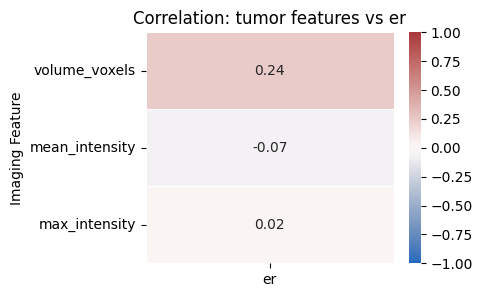

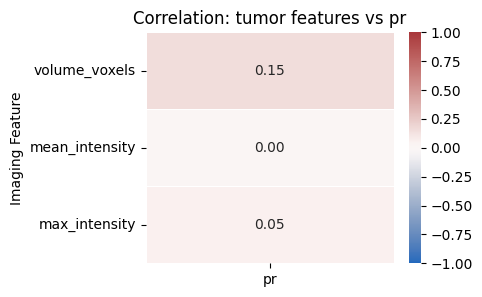

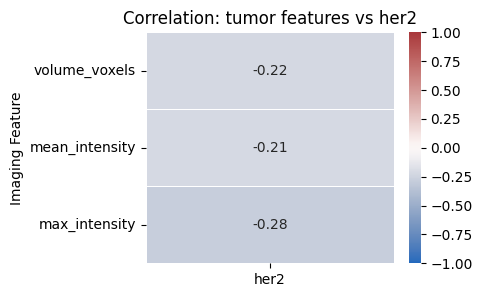

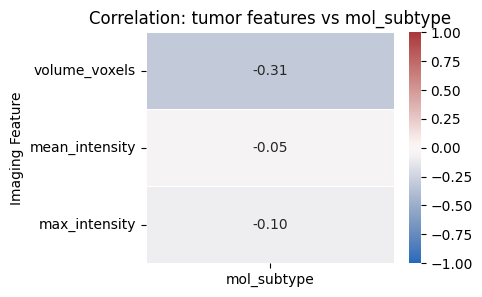

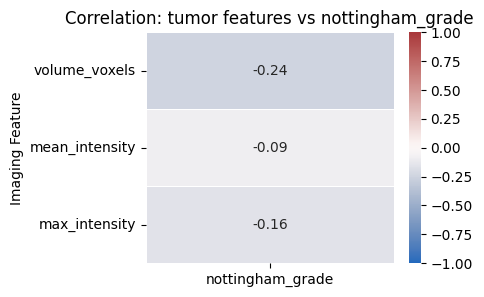

In [20]:
merged = feat_df.join(clinical_df, how="inner")
print(merged.head())

# continuous imaging features
cont_features = ["volume_voxels", "mean_intensity", "max_intensity"]

# ordinal clinical columns
ordinal_cols = ["er", "pr", "her2", "mol_subtype", "nottingham_grade"]

# merged table
merged_df = merged.copy()

for col in ordinal_cols:
    # drop rows missing this clinical variable
    sub = merged_df[cont_features + [col]].dropna()

    # compute correlation
    corr = sub[cont_features + [col]].corr()

    # extract only the correlations of continuous vs this clinical var
    corr_vec = corr[[col]].loc[cont_features]

    # plot heatmap
    plt.figure(figsize=(4, 3))
    sns.heatmap(
        corr_vec,
        annot=True,
        cmap="vlag",
        vmin=-1,
        vmax=1,
        linewidths=0.5,
        fmt=".2f"
    )
    plt.title(f"Correlation: tumor features vs {col}")
    plt.ylabel("Imaging Feature")
    plt.show()


In [ ]:
#assert 0
# from google.colab import runtime
# runtime.unassign()